In [70]:
# Import libraries 
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy

In [71]:
# Global Variables

# Current working directory (= directory for all ipynb-Notebooks)
current_working_directory = os.getcwd()

# Data-Subdirectory
data_sub_dir_name = 'data'

# Data Subdirectory Full Path
data_dir = os.path.join(current_working_directory, data_sub_dir_name)

# Create data-dir if not exits
if not os.path.exists(data_dir):
    os.makedirs(data_dir)

print(data_dir)

/Users/me/Library/CloudStorage/Dropbox/Sorbonne/sep23_03_road_accidents/PROJECT/data


In [73]:
# import pickle.xz-file

df = pd.read_pickle(os.path.join(data_dir, 'df_road_accidents_yhat_proba.xz'))
df.head()

,Num_Acc,grav_sum,grav_1_unharmed,grav_2_lightly_injured,grav_3_hospitalized,grav_4_killed,num_veh,usr_Male,usr_Female,usr_age_000-018,...,crc_REG_OCCITANIE,crc_REG_AUVERGNE-RHONE-ALPES,crc_REG_PROVENCE-ALPES-COTE_D_AZUR,gps,lat,long,target_grav_ternary,target_grav_binary,acc_hlp_date,yhat
0,200500000001,9,4,1,1,0,2,4,2,3,...,0,0,0,M,5051500,294400,1,1,2005-01-12,0.631823
1,200500000002,4,1,0,1,0,2,2,0,0,...,0,0,0,M,5053700,280200,1,1,2005-01-21,0.754961
2,200500000003,4,1,0,1,0,2,2,0,0,...,0,0,0,M,5054600,280000,1,1,2005-01-21,0.847326
3,200500000004,10,0,2,2,0,3,2,2,0,...,0,0,0,M,5098700,240800,1,1,2005-01-04,0.884979
4,200500000005,5,0,1,1,0,1,2,0,1,...,0,0,0,M,5096400,247500,1,1,2005-01-10,0.930071


In [74]:
df.describe()

,Num_Acc,grav_sum,grav_1_unharmed,grav_2_lightly_injured,grav_3_hospitalized,grav_4_killed,num_veh,usr_Male,usr_Female,usr_age_000-018,...,crc_REG_NOUVELLE-AQUITAINE,crc_REG_OCCITANIE,crc_REG_AUVERGNE-RHONE-ALPES,crc_REG_PROVENCE-ALPES-COTE_D_AZUR,lat,long,target_grav_ternary,target_grav_binary,acc_hlp_date,yhat
count,7.997690e+05,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,...,799769.000000,799769.000000,799769.000000,799769.000000,7.997690e+05,799769.0,799769.000000,799769.000000,799769,799769.000000
mean,2.010913e+11,4.235669,0.919532,0.764219,0.507809,0.066068,1.687131,1.497920,0.759708,0.280182,...,0.101553,0.088022,0.101691,0.139555,1.751491e+06,91097.155759,0.537503,0.476481,2011-06-04 22:12:43.285399040,0.476360
min,2.005000e+11,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-524600.0,0.000000,0.000000,2005-01-01 00:00:00,0.009333
25%,2.007001e+11,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.0,0.000000,0.000000,2007-10-16 00:00:00,0.268328
50%,2.011000e+11,4.000000,1.000000,1.000000,0.000000,0.000000,2.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-1.0,0.000000,0.000000,2011-01-18 00:00:00,0.425224
75%,2.014000e+11,5.000000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,4.554580e+06,145894.0,1.000000,1.000000,2014-12-06 00:00:00,0.698890
max,2.018001e+11,190.000000,71.000000,53.000000,42.000000,43.000000,56.000000,50.000000,42.000000,70.000000,...,1.000000,1.000000,1.000000,1.000000,5.121553e+06,6545675.0,2.000000,1.000000,2018-12-31 00:00:00,0.999504
std,4.080517e+08,2.278728,0.949006,0.829371,0.689643,0.277682,0.683396,0.999106,0.908979,0.691580,...,0.302060,0.283327,0.302241,0.346525,2.266588e+06,206636.430296,0.608799,0.499447,NaN,0.251861


# First Part: displaying average predicted road accident severity on a map:

In [75]:
df2 = df[['Num_Acc', 'gps', 'lat', 'long', 'target_grav_binary', 'yhat']]
df2.describe()

,Num_Acc,lat,long,target_grav_binary,yhat
count,7.997690e+05,7.997690e+05,799769.0,799769.000000,799769.000000
mean,2.010913e+11,1.751491e+06,91097.155759,0.476481,0.476360
std,4.080517e+08,2.266588e+06,206636.430296,0.499447,0.251861
min,2.005000e+11,-1.000000e+00,-524600.0,0.000000,0.009333
25%,2.007001e+11,-1.000000e+00,-1.0,0.000000,0.268328
50%,2.011000e+11,0.000000e+00,-1.0,0.000000,0.425224
75%,2.014000e+11,4.554580e+06,145894.0,1.000000,0.698890
max,2.018001e+11,5.121553e+06,6545675.0,1.000000,0.999504


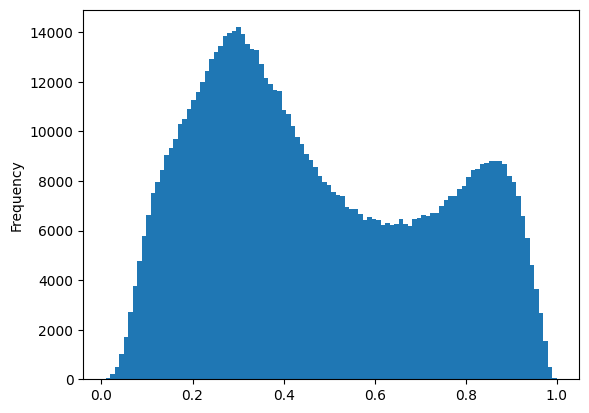

In [76]:
df2['yhat'].plot(kind='hist', bins=100, legend=False);

In [77]:
grouped_data = df.groupby('gps').agg({'lat': ['min', 'max'], 'long': ['min', 'max']})
grouped_data.head()

lat              long         
    min      max      min      max
gps                               
0    -1       -1       -1       -1
A    -1   951215       -1        0
G     0        0        0        0
M    -1  5121553  -524600  6545675

In [78]:
df2 = df2[(df2['gps']=='M')]
df2['lat'] = df2['lat']/100000
df2['long'] = df2['long']/100000
df2.head()

,Num_Acc,gps,lat,long,target_grav_binary,yhat
0,200500000001,M,50.515,2.944,1,0.631823
1,200500000002,M,50.537,2.802,1,0.754961
2,200500000003,M,50.546,2.8,1,0.847326
3,200500000004,M,50.987,2.408,1,0.884979
4,200500000005,M,50.964,2.475,1,0.930071


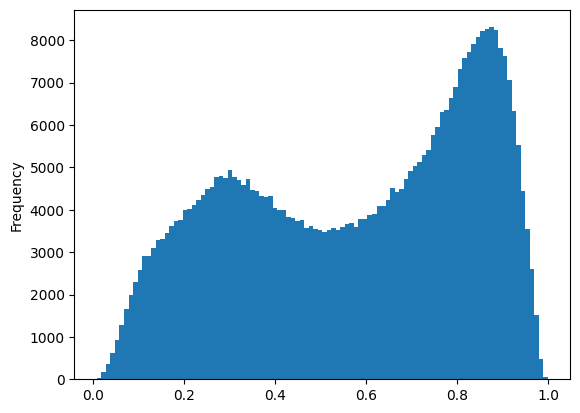

In [79]:
df2['yhat'].plot(kind='hist', bins=100, legend=False);

In [80]:
len(df2)

429955

In [81]:
df2 = df2[(df2['lat']>42) & (df2['lat']<51) & (df2['long']>-5) & (df2['long']<10)]
len(df2)

299428

In [82]:
df2.head(10)

,Num_Acc,gps,lat,long,target_grav_binary,yhat
0,200500000001,M,50.515,2.944,1,0.631823
1,200500000002,M,50.537,2.802,1,0.754961
2,200500000003,M,50.546,2.8,1,0.847326
3,200500000004,M,50.987,2.408,1,0.884979
4,200500000005,M,50.964,2.475,1,0.930071
5,200500000006,M,50.995,2.397,1,0.782849
7,200500000009,M,50.973,2.571,1,0.927640
10,200500000012,M,50.647,2.733,0,0.731400
11,200500000013,M,50.817,2.483,0,0.775475
12,200500000014,M,50.678,2.834,1,0.872701


In [83]:
grouped_data = df2.groupby('gps').agg({'lat': ['min', 'max'], 'long': ['min', 'max']})
grouped_data.head()

lat            long     
         min      max    min  max
gps                              
M    42.0269  50.9995 -4.793  9.8

In [84]:
df2['lat_rnd_up'] = np.ceil(df2['lat']*10)/10
df2['lat_rnd_dn'] = np.floor(df2['lat']*10)/10
df2['long_rnd_up'] = np.ceil(df2['long']*10)/10
df2['long_rnd_dn'] = np.floor(df2['long']*10)/10

df2.head()

,Num_Acc,gps,lat,long,target_grav_binary,yhat,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn
0,200500000001,M,50.515,2.944,1,0.631823,50.6,50.5,3.0,2.9
1,200500000002,M,50.537,2.802,1,0.754961,50.6,50.5,2.9,2.8
2,200500000003,M,50.546,2.8,1,0.847326,50.6,50.5,2.8,2.8
3,200500000004,M,50.987,2.408,1,0.884979,51.0,50.9,2.5,2.4
4,200500000005,M,50.964,2.475,1,0.930071,51.0,50.9,2.5,2.4


In [85]:
df2.describe()

,Num_Acc,lat,long,target_grav_binary,yhat,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn
count,2.994280e+05,299428.000000,299428.0,299428.000000,299428.000000,299428.000000,299428.000000,299428.0,299428.0
mean,2.013615e+11,46.737620,2.430286,0.541706,0.527710,46.787296,46.687737,2.479875,2.38029
std,3.807576e+08,2.258358,2.769201,0.498258,0.264050,2.258728,2.258743,2.768269,2.768304
min,2.005000e+11,42.026900,-4.793,0.000000,0.009333,42.100000,42.000000,-4.7,-4.8
25%,2.011000e+11,44.616015,0.512277,0.000000,0.295392,44.700000,44.600000,0.6,0.5
50%,2.015000e+11,47.367000,2.4249,1.000000,0.520403,47.400000,47.300000,2.5,2.4
75%,2.017000e+11,48.766748,4.716135,1.000000,0.777202,48.800000,48.700000,4.8,4.7
max,2.018001e+11,50.999500,9.8,1.000000,0.999095,51.000000,50.900000,9.8,9.8


In [86]:
df3 = df2.groupby(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'])['yhat'].mean().reset_index()
df3.head(10)

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
0,42.1,42.0,2.6,2.5,0.198930
1,42.1,42.1,0.6,0.6,0.668553
2,42.3,42.2,1.2,1.1,0.516856
3,42.3,42.2,1.6,1.5,0.507756
4,42.3,42.2,2.3,2.2,0.328347
5,42.3,42.2,4.1,4.0,0.178194
6,42.3,42.2,5.4,5.3,0.249729
7,42.3,42.2,6.1,6.0,0.264897
8,42.4,42.3,-0.0,-0.1,0.857902
9,42.4,42.3,0.7,0.6,0.286025


In [87]:
# test to count number of predictions per box after aggregation
test1 = df2.groupby(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'])['yhat'].count().reset_index()
test1.head()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
0,42.1,42.0,2.6,2.5,1
1,42.1,42.1,0.6,0.6,1
2,42.3,42.2,1.2,1.1,1
3,42.3,42.2,1.6,1.5,1
4,42.3,42.2,2.3,2.2,3


In [88]:
test1 = df2.groupby(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'])['yhat'].count().reset_index()
test1.head()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
0,42.1,42.0,2.6,2.5,1
1,42.1,42.1,0.6,0.6,1
2,42.3,42.2,1.2,1.1,1
3,42.3,42.2,1.6,1.5,1
4,42.3,42.2,2.3,2.2,3


In [91]:
df3.describe()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
count,8219.000000,8219.000000,8219.0,8219.0,8219.000000
mean,46.700852,46.611157,2.511717,2.421925,0.730393
std,2.111093,2.110915,2.766615,2.767516,0.142576
min,42.100000,42.000000,-4.7,-4.8,0.048493
25%,44.900000,44.800000,0.4,0.3,0.691696
50%,46.900000,46.800000,2.5,2.4,0.764792
75%,48.400000,48.400000,4.7,4.6,0.816768
max,51.000000,50.900000,9.8,9.8,0.987826


In [92]:
# Number of boxes i.e. risk zones:
len(df3.yhat)

8219

Creating our map (using Folium library):

In [93]:
# creating a tuple containing 2 bounds to create each box on the Folium map using the coordinates
# first bound is the South West point and the second bound is the North East point

df3['bounds'] = list(zip(zip(df3['lat_rnd_dn'], df3['long_rnd_dn']), zip(df3['lat_rnd_up'], df3['long_rnd_up'])))

In [94]:
df3.head()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat,bounds
0,42.1,42.0,2.6,2.5,0.198930,"((42.0, 2.5), (42.1, 2.6))"
1,42.1,42.1,0.6,0.6,0.668553,"((42.1, 0.6), (42.1, 0.6))"
2,42.3,42.2,1.2,1.1,0.516856,"((42.2, 1.1), (42.3, 1.2))"
3,42.3,42.2,1.6,1.5,0.507756,"((42.2, 1.5), (42.3, 1.6))"
4,42.3,42.2,2.3,2.2,0.328347,"((42.2, 2.2), (42.3, 2.3))"


In [95]:
df3 = df3.drop(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'], axis=1)
df3.head(10)

,yhat,bounds
0,0.198930,"((42.0, 2.5), (42.1, 2.6))"
1,0.668553,"((42.1, 0.6), (42.1, 0.6))"
2,0.516856,"((42.2, 1.1), (42.3, 1.2))"
3,0.507756,"((42.2, 1.5), (42.3, 1.6))"
4,0.328347,"((42.2, 2.2), (42.3, 2.3))"
5,0.178194,"((42.2, 4.0), (42.3, 4.1))"
6,0.249729,"((42.2, 5.3), (42.3, 5.4))"
7,0.264897,"((42.2, 6.0), (42.3, 6.1))"
8,0.857902,"((42.3, -0.1), (42.4, -0.0))"
9,0.286025,"((42.3, 0.6), (42.4, 0.7))"


In [96]:
df3.describe()

,yhat
count,8219.000000
mean,0.730393
std,0.142576
min,0.048493
25%,0.691696
50%,0.764792
75%,0.816768
max,0.987826


In [97]:
import folium
# https://matplotlib.org/stable/gallery/color/named_colors.html
center_of_france = [46.71109, 1.7191036]

# Create a folium map centered on France
m = folium.Map(location=center_of_france, zoom_start=6)

# Iterate through the dataframe and add rectangles
for _, row in df3.iterrows():
    # Create a rectangle with the defined bounds
    rectangle = folium.Rectangle(
        bounds=row['bounds'],
        color='grey',
        weight= 0,
        fill=True,
        fill_color='grey',
        fill_opacity=row['yhat'],
        tooltip= "<strong>%.2f%%</strong>" %(row['yhat'] * 100)
    )
    # Add the rectangle to the map
    rectangle.add_to(m)

# Adding a title to the map - Folium doesnt have built-in title setting so we have to use html to add the title:
title_html = '''
<h3 align="center" style="font-size:16px"><b>Map of France divided into risk zones for road accident severity (higher % equals higher risk)</b></h3>
     '''
m.get_root().html.add_child(folium.Element(title_html))

# Display the map with the rectangles
m

# Second Part: splitting results by weather conditions on the map direclty:

A lot of the data preparation steps from before are updated to include weather condition:

In [98]:
df2 = df[['Num_Acc', 'gps', 'lat', 'long', 'target_grav_binary', 'yhat', 'crc_atm_Normal', 'crc_atm_Light_rain', 
         'crc_atm_Heavy_rain', 'crc_atm_Snow_hail', 'crc_atm_Fog_smoke', 'crc_atm_Strong_wind_storm', 
         'crc_atm_Dazzling_weather', 'crc_atm_Overcast_weather', 'crc_atm_Other']]
df2.describe()

,Num_Acc,lat,long,target_grav_binary,yhat,crc_atm_Normal,crc_atm_Light_rain,crc_atm_Heavy_rain,crc_atm_Snow_hail,crc_atm_Fog_smoke,crc_atm_Strong_wind_storm,crc_atm_Dazzling_weather,crc_atm_Overcast_weather,crc_atm_Other
count,7.997690e+05,7.997690e+05,799769.0,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000,799769.000000
mean,2.010913e+11,1.751491e+06,91097.155759,0.476481,0.476360,0.807613,0.101827,0.022094,0.006533,0.007751,0.002617,0.011222,0.032261,0.008082
std,4.080517e+08,2.266588e+06,206636.430296,0.499447,0.251861,0.394175,0.302421,0.146989,0.080563,0.087698,0.051090,0.105338,0.176691,0.089538
min,2.005000e+11,-1.000000e+00,-524600.0,0.000000,0.009333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.007001e+11,-1.000000e+00,-1.0,0.000000,0.268328,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.011000e+11,0.000000e+00,-1.0,0.000000,0.425224,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.014000e+11,4.554580e+06,145894.0,1.000000,0.698890,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2.018001e+11,5.121553e+06,6545675.0,1.000000,0.999504,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [99]:
conditions = [
    df2['crc_atm_Normal'] == 1,
    df2['crc_atm_Light_rain'] == 1,
    df2['crc_atm_Heavy_rain'] == 1,
    df2['crc_atm_Snow_hail'] == 1,
    df2['crc_atm_Fog_smoke'] == 1,
    df2['crc_atm_Strong_wind_storm'] == 1,
    df2['crc_atm_Dazzling_weather'] == 1,
    df2['crc_atm_Overcast_weather'] == 1,
    df2['crc_atm_Other'] == 1
]

choices = ['Normal', 
           'Light rain', 
           'Gloomy or adverse weather (heavy rain, hail or Snow)', 
           'Gloomy or adverse weather (heavy rain, hail or Snow)', 
           'Difficult vision (glare, fog, smoke)', 
           'Other', 
           'Difficult vision (glare, fog, smoke)', 
           'Gloomy or adverse weather (heavy rain, hail or Snow)', 
           'Other']

df2['condition'] = np.select(conditions, choices)
df2.head(20)

/var/folders/bc/vjs5wd952x9_hmrg_8s2jhbc0000gn/T/ipykernel_1156/2454978948.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['condition'] = np.select(conditions, choices)


,Num_Acc,gps,lat,long,target_grav_binary,yhat,crc_atm_Normal,crc_atm_Light_rain,crc_atm_Heavy_rain,crc_atm_Snow_hail,crc_atm_Fog_smoke,crc_atm_Strong_wind_storm,crc_atm_Dazzling_weather,crc_atm_Overcast_weather,crc_atm_Other,condition
0,200500000001,M,5051500,294400,1,0.631823,1,0,0,0,0,0,0,0,0,Normal
1,200500000002,M,5053700,280200,1,0.754961,1,0,0,0,0,0,0,0,0,Normal
2,200500000003,M,5054600,280000,1,0.847326,0,1,0,0,0,0,0,0,0,Light rain
3,200500000004,M,5098700,240800,1,0.884979,1,0,0,0,0,0,0,0,0,Normal
4,200500000005,M,5096400,247500,1,0.930071,0,0,1,0,0,0,0,0,0,"Gloomy or adverse weather (heavy rain, hail or..."
5,200500000006,M,5099500,239700,1,0.782849,0,0,0,0,0,0,0,1,0,"Gloomy or adverse weather (heavy rain, hail or..."
6,200500000007,M,0,0,0,0.661088,1,0,0,0,0,0,0,0,0,Normal
7,200500000009,M,5097300,257100,1,0.927640,0,0,0,0,0,0,0,1,0,"Gloomy or adverse weather (heavy rain, hail or..."
8,200500000010,M,5106500,252400,1,0.813862,0,1,0,0,0,0,0,0,0,Light rain
9,200500000011,M,0,0,0,0.624084,1,0,0,0,0,0,0,0,0,Normal


In [100]:
df2.condition.value_counts()

condition
Normal                                                  645904
Light rain                                               81438
Gloomy or adverse weather (heavy rain, hail or Snow)     48696
Difficult vision (glare, fog, smoke)                     15174
Other                                                     8557
Name: count, dtype: int64

In [101]:
df2 = df2[['Num_Acc', 'gps', 'lat', 'long', 'yhat', 'condition']]
df2.head(20)

,Num_Acc,gps,lat,long,yhat,condition
0,200500000001,M,5051500,294400,0.631823,Normal
1,200500000002,M,5053700,280200,0.754961,Normal
2,200500000003,M,5054600,280000,0.847326,Light rain
3,200500000004,M,5098700,240800,0.884979,Normal
4,200500000005,M,5096400,247500,0.930071,"Gloomy or adverse weather (heavy rain, hail or..."
5,200500000006,M,5099500,239700,0.782849,"Gloomy or adverse weather (heavy rain, hail or..."
6,200500000007,M,0,0,0.661088,Normal
7,200500000009,M,5097300,257100,0.927640,"Gloomy or adverse weather (heavy rain, hail or..."
8,200500000010,M,5106500,252400,0.813862,Light rain
9,200500000011,M,0,0,0.624084,Normal


In [102]:
test1 = df2.groupby('condition')['yhat'].mean().reset_index()
test1 = test1.sort_values('yhat')
test1

,condition,yhat
2,Light rain,0.432379
3,Normal,0.472107
1,"Gloomy or adverse weather (heavy rain, hail or...",0.522742
4,Other,0.592461
0,"Difficult vision (glare, fog, smoke)",0.679130


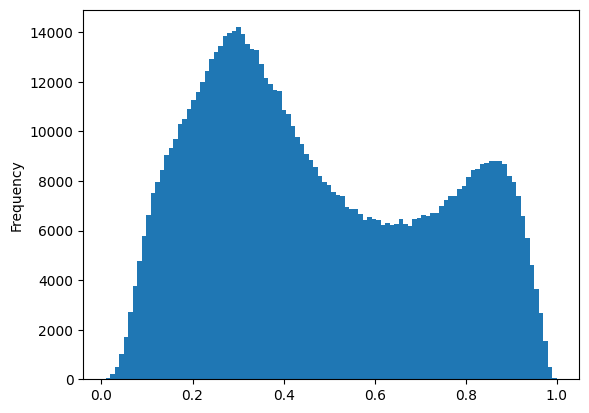

In [103]:
df2.yhat.plot(kind='hist', bins=100);

In [104]:
grouped_data = df2.groupby('gps').agg({'lat': ['min', 'max'], 'long': ['min', 'max']})
grouped_data.head()

lat              long         
    min      max      min      max
gps                               
0    -1       -1       -1       -1
A    -1   951215       -1        0
G     0        0        0        0
M    -1  5121553  -524600  6545675

In [105]:
df2 = df2[(df2['gps']=='M')]
df2['lat'] = df2['lat']/100000
df2['long'] = df2['long']/100000
df2.head()

,Num_Acc,gps,lat,long,yhat,condition
0,200500000001,M,50.515,2.944,0.631823,Normal
1,200500000002,M,50.537,2.802,0.754961,Normal
2,200500000003,M,50.546,2.8,0.847326,Light rain
3,200500000004,M,50.987,2.408,0.884979,Normal
4,200500000005,M,50.964,2.475,0.930071,"Gloomy or adverse weather (heavy rain, hail or..."


<Axes: ylabel='Frequency'>

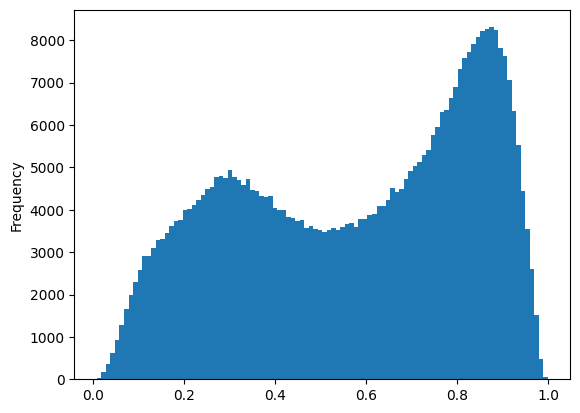

In [106]:
df2.yhat.plot(kind='hist', bins=100)

In [107]:
len(df2)

429955

In [108]:
df2 = df2[(df2['lat']>42) & (df2['lat']<51) & (df2['long']>-5) & (df2['long']<10)]
len(df2)

299428

In [109]:
df2.head(10)

,Num_Acc,gps,lat,long,yhat,condition
0,200500000001,M,50.515,2.944,0.631823,Normal
1,200500000002,M,50.537,2.802,0.754961,Normal
2,200500000003,M,50.546,2.8,0.847326,Light rain
3,200500000004,M,50.987,2.408,0.884979,Normal
4,200500000005,M,50.964,2.475,0.930071,"Gloomy or adverse weather (heavy rain, hail or..."
5,200500000006,M,50.995,2.397,0.782849,"Gloomy or adverse weather (heavy rain, hail or..."
7,200500000009,M,50.973,2.571,0.927640,"Gloomy or adverse weather (heavy rain, hail or..."
10,200500000012,M,50.647,2.733,0.731400,Normal
11,200500000013,M,50.817,2.483,0.775475,Normal
12,200500000014,M,50.678,2.834,0.872701,Light rain


In [110]:
grouped_data = df2.groupby('gps').agg({'lat': ['min', 'max'], 'long': ['min', 'max']})
grouped_data.head()

lat            long     
         min      max    min  max
gps                              
M    42.0269  50.9995 -4.793  9.8

In [111]:
df2['lat_rnd_up'] = np.ceil(df2['lat']*5)/5
df2['lat_rnd_dn'] = np.floor(df2['lat']*5)/5
df2['long_rnd_up'] = np.ceil(df2['long']*5)/5
df2['long_rnd_dn'] = np.floor(df2['long']*5)/5

df2.head()

,Num_Acc,gps,lat,long,yhat,condition,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn
0,200500000001,M,50.515,2.944,0.631823,Normal,50.6,50.4,3.0,2.8
1,200500000002,M,50.537,2.802,0.754961,Normal,50.6,50.4,3.0,2.8
2,200500000003,M,50.546,2.8,0.847326,Light rain,50.6,50.4,2.8,2.8
3,200500000004,M,50.987,2.408,0.884979,Normal,51.0,50.8,2.6,2.4
4,200500000005,M,50.964,2.475,0.930071,"Gloomy or adverse weather (heavy rain, hail or...",51.0,50.8,2.6,2.4


In [112]:
df2.describe()

,Num_Acc,lat,long,yhat,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn
count,2.994280e+05,299428.000000,299428.0,299428.000000,299428.000000,299428.000000,299428.0,299428.0
mean,2.013615e+11,46.737620,2.430286,0.527710,46.837669,46.638167,2.531053,2.33154
std,3.807576e+08,2.258358,2.769201,0.264050,2.257331,2.257361,2.766647,2.76667
min,2.005000e+11,42.026900,-4.793,0.009333,42.200000,42.000000,-4.6,-4.8
25%,2.011000e+11,44.616015,0.512277,0.295392,44.800000,44.600000,0.6,0.4
50%,2.015000e+11,47.367000,2.4249,0.520403,47.400000,47.200000,2.6,2.4
75%,2.017000e+11,48.766748,4.716135,0.777202,48.800000,48.600000,4.8,4.6
max,2.018001e+11,50.999500,9.8,0.999095,51.000000,50.800000,9.8,9.8


In [113]:
df3 = df2.groupby(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn', 'condition'])['yhat'].mean().reset_index()
df3.head(10)

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,condition,yhat
0,42.2,42.0,0.6,0.6,Normal,0.668553
1,42.2,42.0,2.6,2.4,Light rain,0.198930
2,42.4,42.2,-0.0,-0.2,Normal,0.857902
3,42.4,42.2,0.8,0.6,Normal,0.286025
4,42.4,42.2,1.2,1.0,Normal,0.516856
5,42.4,42.2,1.6,1.4,Normal,0.507756
6,42.4,42.2,2.4,2.2,Light rain,0.381000
7,42.4,42.2,2.4,2.2,Normal,0.223040
8,42.4,42.2,2.6,2.4,Normal,0.887323
9,42.4,42.2,2.8,2.6,Normal,0.820202


In [114]:
df3.describe()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
count,8482.00000,8482.000000,8482.0,8482.0,8482.000000
mean,46.81983,46.630865,2.486112,2.296935,0.723732
std,2.11434,2.114185,2.807973,2.808657,0.149271
min,42.20000,42.000000,-4.6,-4.8,0.061972
25%,45.00000,44.800000,0.4,0.2,0.661748
50%,47.00000,47.000000,2.6,2.4,0.754871
75%,48.60000,48.400000,4.8,4.6,0.824009
max,51.00000,50.800000,9.8,9.8,0.989146


In [115]:
# test to count number of predictions per box after aggregation
test2 = df2.groupby(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'])['yhat'].count().reset_index()
test2.head()

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,yhat
0,42.2,42.0,0.6,0.6,1
1,42.2,42.0,2.6,2.4,1
2,42.4,42.2,-0.0,-0.2,1
3,42.4,42.2,0.8,0.6,1
4,42.4,42.2,1.2,1.0,1


In [116]:
# Number of boxes i.e. risk zones:
len(df3.yhat)

8482

Creating our map (using Folium library):

In [117]:
# creating a tuple containing 2 bounds to create each box on the Folium map using the coordinates
# first bound is the South West point and the second bound is the North East point

df3['bounds'] = list(zip(zip(df3['lat_rnd_dn'], df3['long_rnd_dn']), zip(df3['lat_rnd_up'], df3['long_rnd_up'])))

In [118]:
df3.head(20)

,lat_rnd_up,lat_rnd_dn,long_rnd_up,long_rnd_dn,condition,yhat,bounds
0,42.2,42.0,0.6,0.6,Normal,0.668553,"((42.0, 0.6), (42.2, 0.6))"
1,42.2,42.0,2.6,2.4,Light rain,0.198930,"((42.0, 2.4), (42.2, 2.6))"
2,42.4,42.2,-0.0,-0.2,Normal,0.857902,"((42.2, -0.2), (42.4, -0.0))"
3,42.4,42.2,0.8,0.6,Normal,0.286025,"((42.2, 0.6), (42.4, 0.8))"
4,42.4,42.2,1.2,1.0,Normal,0.516856,"((42.2, 1.0), (42.4, 1.2))"
5,42.4,42.2,1.6,1.4,Normal,0.507756,"((42.2, 1.4), (42.4, 1.6))"
6,42.4,42.2,2.4,2.2,Light rain,0.381000,"((42.2, 2.2), (42.4, 2.4))"
7,42.4,42.2,2.4,2.2,Normal,0.223040,"((42.2, 2.2), (42.4, 2.4))"
8,42.4,42.2,2.6,2.4,Normal,0.887323,"((42.2, 2.4), (42.4, 2.6))"
9,42.4,42.2,2.8,2.6,Normal,0.820202,"((42.2, 2.6), (42.4, 2.8))"


In [119]:
df3 = df3.drop(['lat_rnd_up', 'lat_rnd_dn', 'long_rnd_up', 'long_rnd_dn'], axis=1)
df3.head(10)

,condition,yhat,bounds
0,Normal,0.668553,"((42.0, 0.6), (42.2, 0.6))"
1,Light rain,0.198930,"((42.0, 2.4), (42.2, 2.6))"
2,Normal,0.857902,"((42.2, -0.2), (42.4, -0.0))"
3,Normal,0.286025,"((42.2, 0.6), (42.4, 0.8))"
4,Normal,0.516856,"((42.2, 1.0), (42.4, 1.2))"
5,Normal,0.507756,"((42.2, 1.4), (42.4, 1.6))"
6,Light rain,0.381000,"((42.2, 2.2), (42.4, 2.4))"
7,Normal,0.223040,"((42.2, 2.2), (42.4, 2.4))"
8,Normal,0.887323,"((42.2, 2.4), (42.4, 2.6))"
9,Normal,0.820202,"((42.2, 2.6), (42.4, 2.8))"


In [120]:
test3 = df3.sort_values("bounds")
test3.head(30)

,condition,yhat,bounds
0,Normal,0.668553,"((42.0, 0.6), (42.2, 0.6))"
1,Light rain,0.198930,"((42.0, 2.4), (42.2, 2.6))"
2,Normal,0.857902,"((42.2, -0.2), (42.4, -0.0))"
3,Normal,0.286025,"((42.2, 0.6), (42.4, 0.8))"
4,Normal,0.516856,"((42.2, 1.0), (42.4, 1.2))"
5,Normal,0.507756,"((42.2, 1.4), (42.4, 1.6))"
6,Light rain,0.381000,"((42.2, 2.2), (42.4, 2.4))"
7,Normal,0.223040,"((42.2, 2.2), (42.4, 2.4))"
8,Normal,0.887323,"((42.2, 2.4), (42.4, 2.6))"
9,Normal,0.820202,"((42.2, 2.6), (42.4, 2.8))"


In [121]:
for weather in df3['condition'].unique():
    print(weather)

Normal
Light rain
Gloomy or adverse weather (heavy rain, hail or Snow)
Difficult vision (glare, fog, smoke)
Other


In [122]:
filename = 'risk_zones.xz'
df3.to_pickle(os.path.join(data_dir, filename), compression='xz')

In [123]:
import folium

center_of_france = [46.71109, 1.7191036]

# we create a folium map centered on France
m = folium.Map(location=center_of_france, zoom_start=6, tiles=None)

# manually adding the background map so it's always displayed when switching between differnet layers (weather conditions)
folium.TileLayer('openstreetmap', name='Background Map (openstreetmap)', overlay=True).add_to(m)

for weather in df3['condition'].unique():
    fg = folium.FeatureGroup(name=weather.capitalize(), overlay=False)
    
    # We filter df3 for the current weather condition
    df_filtered = df3[df3['condition'] == weather]
    
    for _, row in df_filtered.iterrows():
        # Create a rectangle with the defined bounds
        rectangle = folium.Rectangle(
            bounds=row['bounds'],
            color='black',
            weight= 0,
            fill=True,
            fill_color='gray',
            fill_opacity=row['yhat'],
            tooltip= "<strong>%.0f%%</strong>" %(row['yhat'] * 100)
        ).add_to(fg)
    # Add the rectangles to the map
    fg.add_to(m)

# Add a LayerControl to switch between different weather conditions
folium.LayerControl(collapsed=True).add_to(m)

# Adding a title to the map - Folium doesnt have built-in title setting so we have to use html to add the title:
title_html = '''
<h3 align="center" style="font-size:16px"><b>Map of France divided into risk zones for road accident severity (higher % equals higher risk)</b></h3>
     '''
m.get_root().html.add_child(folium.Element(title_html))

# Display the map with the rectangles
m

# The below are experiments we did with Seaborn map & geocoding libraries:
they're not needed anymore & can be deleted

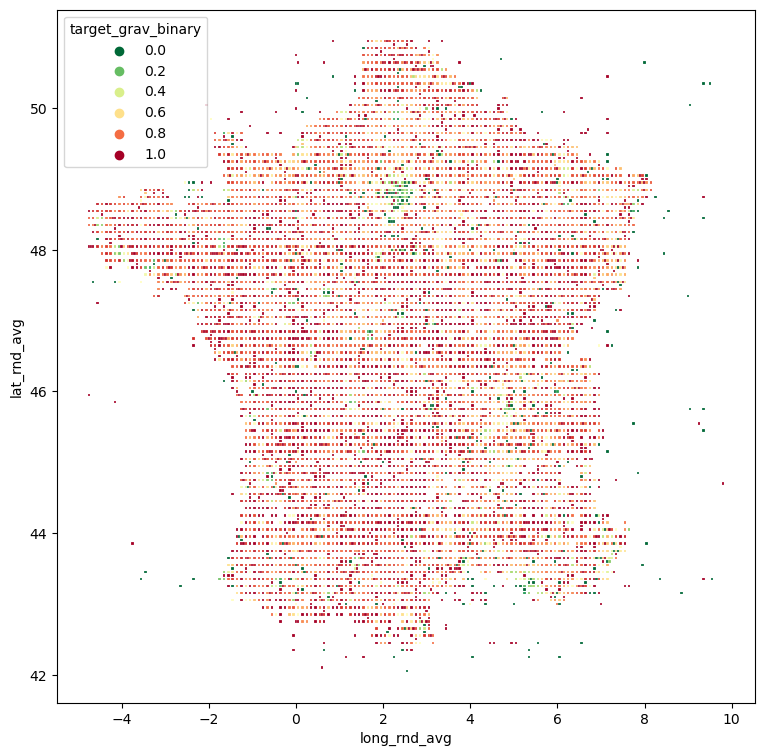

In [14]:
#6: See France and Corse on a map
import seaborn as sns

#dta = df_sev[((df_sev['long']<-1) | (df_sev['long']>-1)) &  (df_sev.gps=='M') & (df_sev.lat>4200000) & (df_sev.long<1000000)]

fig, ax = plt.subplots(figsize=(9, 9))
sns.scatterplot(data=df3, x=df3.long_rnd_avg, y=df3.lat_rnd_avg, marker='s', s=3, ax=ax, hue='target_grav_binary', palette="RdYlGn_r")

#paris = pd.DataFrame({'long': [234901.4], 'lat': [4886471.6]})
#paris.plot('long', 'lat', style='r-', label='Paris', marker=".", markersize=1, ax=ax, legend=None)
#plt.ylim(-5e6,6e6)
#plt.xlim(-5e6,6e6)
plt.show();

In [ ]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="gwerafradw")

import pgeocode
nomi = pgeocode.Nominatim('FR')

lat = 50.515
long = 2.944

# Use geopy to reverse geocode the coordinates and retrieve the postal code
location = geolocator.reverse((50.515, 2.944), exactly_one=True)
postal_code = location.raw['address']['postcode']
print(postal_code)

# Use pgeocode to query the canton name using the retrieved postal code
canton_name = nomi.query_postal_code(postal_code)['county_name']
print(canton_name)

In [ ]:
import reverse_geocoder as rg

coordinates = (50.964, 2.475)
result = rg.search(coordinates)
print(result)

print(result[0]['name'])  # Name of the closest city/town
print(result[0]['admin1'])  # First-order administrative division (e.g., state, province)
print(result[0]['admin2'])  # Second-order administrative division (e.g., county)

In [ ]:
test = df2.head(500)
test.head()

In [ ]:
def get_closest_city(row):
    coordinates = (row['lat'], row['long'])
    result = rg.search(coordinates)
    return result[0]['name']

In [ ]:
test['county'] = test.apply(get_closest_city, axis=1)

In [ ]:
test.county.value_counts()

In [ ]:
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

geolocator = Nominatim(user_agent="geoapi_Ahed_roadaccidnets")

def get_location(row):
    latitute = row['lat']
    longitude = row['long']
    # Perform the reverse geocode query
    location = geolocator.reverse((latitude, longitude), exactly_one=True, timeout=10, language='en')
    if location and 'address' in location.raw:
        address = location.raw['address']
        department_name = address.get('county')
        return department_name
    return None

In [ ]:
#for lat, long in zip(test['lat'], test['long']):
#    test['department'] = get_location(lat, long)

test['department'] = test.apply(get_location, axis=1)